## **Tarea**

### **Qué problemas se identifican en el dataset?**
- Tip (Datos complejos donde involucran muchas variables)
- A partir de la data, es posible determinar si existen un conjunto de estaciones aisladas?


Intentemos responder la siguiente pregunta:


# **<center>¿asf? </center>**

Esta pregunta responde a:
**¿?**

Pasos:

**A.  Importar las librerias necesarias.**

**B.  Cargar los datos.**

**C.  Limpieza y preprocesamiento.**
*   Verificar valores nulos, tipos de datos.
*   Renombrar columnas si es necesario.
*   Calcular columnas nuevas (ej: distancias al centro).
    -  Calcular la distancia desde la estación de devolución de bicicletas (chekout) al cetro de Boston:

        1. Establecer las coordenadas del centro de la ciudad (Boston como referencia).
        2. Unir coordenadas de la estación final al DataFrame de viajes.
        3. Calcular distancia Haversine en km.
        4. Calcular distancia desde cada estación final al centro.

**D.  Agrupar y resumir los datos.**
*   Cómo medimos el uso de bicicletas?, cuantificando el uso de bicicletas dependiendo de la distan desde el centro de la ciudad:
  1. Calcular número de checkouts por estación final.
  2. Seleccionar columnas relevantes del DataFrame de estaciones.
  3. Unir los dos DataFrames en uno solo.

**E. Ajustar el modelo.**
1.   Preparar los datos sin valores nulos.
2.   Ajustar el modelo lineal.
3.   Predecir para 2.5 millas.

**F. Realizar predicciones.**

**G. Visualizar los resultados**
___

**A.  Importar las librerias necesarias.**

In [6]:
from typing import Set, Dict, List
from collections import defaultdict



In [7]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from math import radians, cos, sin, asin, sqrt
import networkx as nx

%matplotlib inline

**B.  Cargar los datos.**

In [8]:
stations:pd.DataFrame = pd.read_csv("dataset/hubway_stations.csv")
trips:pd.DataFrame = pd.read_csv("dataset/hubway_trips.csv")

**C.  Limpieza y preprocesamiento.**

In [9]:
stations.info()
stations.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         142 non-null    int64  
 1   terminal   142 non-null    object 
 2   station    142 non-null    object 
 3   municipal  142 non-null    object 
 4   lat        142 non-null    float64
 5   lng        142 non-null    float64
 6   status     142 non-null    object 
dtypes: float64(2), int64(1), object(4)
memory usage: 7.9+ KB


(142, 7)

In [10]:
stations.head(20)

,id,terminal,station,municipal,lat,lng,status
0,3,B32006,Colleges of the Fenway,Boston,42.340021,-71.100812,Existing
1,4,C32000,Tremont St. at Berkeley St.,Boston,42.345392,-71.069616,Existing
2,5,B32012,Northeastern U / North Parking Lot,Boston,42.341814,-71.090179,Existing
3,6,D32000,Cambridge St. at Joy St.,Boston,42.361285,-71.065140,Existing
4,7,A32000,Fan Pier,Boston,42.353412,-71.044624,Existing
5,8,A32001,Union Square - Brighton Ave. at Cambridge St.,Boston,42.353334,-71.137313,Existing
6,9,A32002,Agganis Arena - 925 Comm Ave.,Boston,42.351313,-71.116174,Existing
7,10,A32003,B.U. Central - 725 Comm. Ave.,Boston,42.350075,-71.105884,Existing
8,11,A32004,Longwood Ave / Binney St,Boston,42.338629,-71.106500,Existing
9,12,B32002,Ruggles Station / Columbus Ave.,Boston,42.335911,-71.088496,Existing


In [11]:
stations['status'].value_counts().to_frame()
# stations.head(20)
stations[stations['terminal'] == 'C32002']

,id,terminal,station,municipal,lat,lng,status
10,13,C32002,Boston Medical Center - 721 Mass. Ave.,Boston,42.334057,-71.074030,Removed
98,102,C32002,Boston Medical Center - East Concord at Harri...,Boston,42.336437,-71.073089,Existing


In [12]:
trips.head(10)
# trips['status'].value_counts()
# trips['start_date'].value_counts().to_frame()
# trips.shape

,seq_id,hubway_id,status,duration,start_date,strt_statn,end_date,end_statn,bike_nr,subsc_type,zip_code,birth_date,gender
0,1,8,Closed,9,7/28/2011 10:12:00,23.0,7/28/2011 10:12:00,23.0,B00468,Registered,'97217,1976.0,Male
1,2,9,Closed,220,7/28/2011 10:21:00,23.0,7/28/2011 10:25:00,23.0,B00554,Registered,'02215,1966.0,Male
2,3,10,Closed,56,7/28/2011 10:33:00,23.0,7/28/2011 10:34:00,23.0,B00456,Registered,'02108,1943.0,Male
3,4,11,Closed,64,7/28/2011 10:35:00,23.0,7/28/2011 10:36:00,23.0,B00554,Registered,'02116,1981.0,Female
4,5,12,Closed,12,7/28/2011 10:37:00,23.0,7/28/2011 10:37:00,23.0,B00554,Registered,'97214,1983.0,Female
5,6,13,Closed,19,7/28/2011 10:39:00,23.0,7/28/2011 10:39:00,23.0,B00456,Registered,'02021,1951.0,Male
6,7,14,Closed,24,7/28/2011 10:47:00,23.0,7/28/2011 10:47:00,23.0,B00554,Registered,'02140,1971.0,Female
7,8,15,Closed,7,7/28/2011 10:48:00,23.0,7/28/2011 10:48:00,23.0,B00554,Registered,'02140,1971.0,Female
8,9,16,Closed,8,7/28/2011 11:01:00,23.0,7/28/2011 11:01:00,23.0,B00554,Registered,'97214,1983.0,Female
9,10,17,Closed,1108,7/28/2011 11:55:00,47.0,7/28/2011 12:13:00,40.0,B00550,Registered,'01867,1994.0,Male


In [13]:
trips['start_date'] = pd.to_datetime(trips['start_date'], format='%m/%d/%Y %H:%M:%S')
# conteo = trips['start_date'].value_counts().to_frame(name='count').sort_index(ascending=True)
# Paso 2: Extraemos solo la fecha (sin la hora)
trips['start_date'] = trips['start_date'].dt.date
trips['bike_nr'].value_counts().to_frame(name='count').sort_index(ascending=True)
# Paso 3: Contamos cuántos viajes hay por día
# conteo_dias = trips['start_date'].value_counts().sort_index().to_frame(name='count')
# conteo_dias



,count
bike_nr,
A07799,228
A07800,249
A07807,329
A07808,283
A07809,270
...,...
T01448,1264
T01449,1351
T01450,1310


In [14]:
stations.dropna(axis=0, inplace=True)
trips.dropna(axis=0, inplace=True)

In [15]:
stations.info()
stations.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         142 non-null    int64  
 1   terminal   142 non-null    object 
 2   station    142 non-null    object 
 3   municipal  142 non-null    object 
 4   lat        142 non-null    float64
 5   lng        142 non-null    float64
 6   status     142 non-null    object 
dtypes: float64(2), int64(1), object(4)
memory usage: 7.9+ KB


(142, 7)

In [16]:
trips.info()
trips.shape

<class 'pandas.core.frame.DataFrame'>
Index: 350398 entries, 0 to 549285
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   seq_id      350398 non-null  int64  
 1   hubway_id   350398 non-null  int64  
 2   status      350398 non-null  object 
 3   duration    350398 non-null  int64  
 4   start_date  350398 non-null  object 
 5   strt_statn  350398 non-null  float64
 6   end_date    350398 non-null  object 
 7   end_statn   350398 non-null  float64
 8   bike_nr     350398 non-null  object 
 9   subsc_type  350398 non-null  object 
 10  zip_code    350398 non-null  object 
 11  birth_date  350398 non-null  float64
 12  gender      350398 non-null  object 
dtypes: float64(3), int64(3), object(7)
memory usage: 37.4+ MB


(350398, 13)

In [17]:
trips['strt_statn'] = trips['strt_statn'].astype(int)
trips['end_statn'] = trips['end_statn'].astype(int)
stations['id'] = stations['id'].astype(int)

In [18]:
trips.info()

<class 'pandas.core.frame.DataFrame'>
Index: 350398 entries, 0 to 549285
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   seq_id      350398 non-null  int64  
 1   hubway_id   350398 non-null  int64  
 2   status      350398 non-null  object 
 3   duration    350398 non-null  int64  
 4   start_date  350398 non-null  object 
 5   strt_statn  350398 non-null  int64  
 6   end_date    350398 non-null  object 
 7   end_statn   350398 non-null  int64  
 8   bike_nr     350398 non-null  object 
 9   subsc_type  350398 non-null  object 
 10  zip_code    350398 non-null  object 
 11  birth_date  350398 non-null  float64
 12  gender      350398 non-null  object 
dtypes: float64(1), int64(5), object(7)
memory usage: 37.4+ MB


In [19]:
# Crear grafo dirigido
G = nx.DiGraph()
# Aseguramos incluir nodos sin viajes incluso
G.add_nodes_from(stations['id'].tolist())
# for i, j in zip(trips['strt_statn'], trips['end_statn']):
#     print(i, j)
G.add_edges_from(zip(trips['strt_statn'], trips['end_statn']))

components = list(nx.weakly_connected_components(G))
num_components = len(components)
print(num_components)
for i, comp in enumerate(components):
    print(f"Componente {i+1}: {sorted(list(comp))}")


48
Componente 1: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
Componente 2: [99]
Componente 3: [100]
Componente 4: [101]
Componente 5: [102]
Componente 6: [103]
Componente 7: [104]
Componente 8: [105]
Componente 9: [106]
Componente 10: [107]
Componente 11: [108]
Componente 12: [109]
Componente 13: [110]
Componente 14: [111]
Componente 15: [112]
Componente 16: [113]
Componente 17: [114]
Componente 18: [115]
Componente 19: [116]
Componente 20: [117]
Componente 21: [118]
Componente 22: [119]
Componente 23: [120]
Componente 24: [121]
Componente 25: [122]
Componente 26: [123]
Componente 27: [124]
Componente 28: [125]
Componente 29: [126]
Componente 30: [127]
Component

In [20]:
adj_list: Dict[int, Set[int]] = defaultdict(set)

# Agregar aristas dirigidas a → b
for _, row in trips.iterrows():
    a: int = row['strt_statn']
    b: int = row['end_statn']
    adj_list[a].add(b)

# -------------------------------
# 🧩 Conjunto de todos los nodos posibles (estaciones)
# -------------------------------
all_nodes: Set[int] = set(stations['id'])


# -------------------------------
# 🔁 Crear grafo no dirigido para DFS (para encontrar componentes)
# -------------------------------
undirected_adj: Dict[int, Set[int]] = defaultdict(set)

for a in adj_list:
    for b in adj_list[a]:
        undirected_adj[a].add(b)
        undirected_adj[b].add(a)  # Convertir a no dirigido

# -------------------------------
# 🔍 DFS manual para detectar componentes
# -------------------------------
visited: Set[int] = set()
components: List[Set[int]] = []

def dfs(node: int) -> Set[int]:
    """
    Realiza un recorrido DFS desde el nodo dado.

    Args:
        node (int): Nodo desde el cual comenzar el recorrido.
    Returns:
        Set[int]: Conjunto de nodos que forman la componente actual.
    """
    stack: List[int] = [node]
    component_nodes: Set[int] = set()

    while stack:
        current: int = stack.pop()
        if current not in visited:
            visited.add(current)
            component_nodes.add(current)
            vecinos_no_visitados: Set[int] = undirected_adj[current] - visited
            stack.extend(vecinos_no_visitados)
    return component_nodes


# -------------------------------
# 🔢 Contar componentes conexas
# -------------------------------
component_count: int = 0

for node in all_nodes:
    if node not in visited:
        nueva_componente: Set[int] = dfs(node)
        components.append(nueva_componente)
        component_count += 1

# -------------------------------
# 📊 Resultado final
# -------------------------------
print(f"🔗 Número de componentes (como grafo no dirigido): {component_count}")
print("📋 Componentes encontradas (IDs por componente):")
for i, comp in enumerate(components, 1):
    print(f" - Componente {i}: {sorted(list(comp))}")

🔗 Número de componentes (como grafo no dirigido): 48
📋 Componentes encontradas (IDs por componente):
 - Componente 1: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
 - Componente 2: [99]
 - Componente 3: [100]
 - Componente 4: [101]
 - Componente 5: [102]
 - Componente 6: [103]
 - Componente 7: [104]
 - Componente 8: [105]
 - Componente 9: [106]
 - Componente 10: [107]
 - Componente 11: [108]
 - Componente 12: [109]
 - Componente 13: [110]
 - Componente 14: [111]
 - Componente 15: [112]
 - Componente 16: [113]
 - Componente 17: [114]
 - Componente 18: [115]
 - Componente 19: [116]
 - Componente 20: [117]
 - Componente 21: [118]
 - Componente 22: [119]
 - Componente

In [21]:
componente_principal = components[0]
componente_principal = [3]
print(len(componente_principal))
trips_componente: pd.DataFrame = trips[
    trips['strt_statn'].isin(componente_principal) &
    trips['end_statn'].isin(componente_principal)
].copy()

print(trips_componente.shape)
print(trips.shape)


1
(77, 13)
(350398, 13)


In [22]:

#Deterinar los registros que tengan como valor 'strt_statn' y 'end_statn' el mismo valor
trips_componente[ trips_componente['strt_statn'] == trips_componente['end_statn'] ]

,seq_id,hubway_id,status,duration,start_date,strt_statn,end_date,end_statn,bike_nr,subsc_type,zip_code,birth_date,gender
61,62,85,Closed,50,2011-07-28,3,7/28/2011 12:32:00,3,B00071,Registered,'02118,1967.0,Male
335,336,382,Closed,7,2011-07-28,3,7/28/2011 20:04:00,3,B00214,Registered,'02113,1986.0,Male
776,777,863,Closed,148,2011-07-29,3,7/29/2011 16:43:00,3,B00548,Registered,'02446,1986.0,Male
782,783,869,Closed,9,2011-07-29,3,7/29/2011 16:44:00,3,B00548,Registered,'02446,1986.0,Male
788,789,875,Closed,118,2011-07-29,3,7/29/2011 16:51:00,3,B00548,Registered,'02446,1986.0,Male
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495568,495569,560030,Closed,211,2012-09-12,3,9/12/2012 08:50:00,3,B00111,Registered,'02215,1972.0,Male
507105,507106,573082,Closed,3,2012-09-15,3,9/15/2012 15:48:00,3,B00604,Registered,'02215,1991.0,Male
523912,523913,591798,Closed,7,2012-09-21,3,9/21/2012 07:47:00,3,B00201,Registered,'02360,1961.0,Female
529463,529464,598074,Closed,60,2012-09-22,3,9/22/2012 21:15:00,3,B00153,Registered,'02115,1993.0,Male


In [23]:
# -------------------------------
# 🕸️ Grafo dirigido solo con nodos activos
# -------------------------------
nodos_activos: Set[int] = set(trips['strt_statn']).union(set(trips['end_statn']))

G_dirigido: nx.DiGraph = nx.DiGraph()
G_dirigido.add_nodes_from(nodos_activos)
G_dirigido.add_edges_from(zip(trips['strt_statn'], trips['end_statn']))


# -------------------------------
# 🔍 Componentes fuertemente conexas (SCCs)
# -------------------------------
sccs: List[Set[int]] = list(nx.strongly_connected_components(G_dirigido))
num_sccs: int = len(sccs)

print(f"🔁 Número de componentes fuertemente conexas (SCCs): {num_sccs}")

# Opcional: ver tamaños
scc_sizes: List[int] = [len(c) for c in sccs]
scc_sizes.sort(reverse=True)
print("📊 Tamaños de las SCCs más grandes:", scc_sizes[:5])

🔁 Número de componentes fuertemente conexas (SCCs): 1
📊 Tamaños de las SCCs más grandes: [95]


In [24]:
import pandas as pd
import folium
from typing import Dict

# -----------------------------------
# Cargar y preparar datos
# -----------------------------------
# stations: pd.DataFrame = pd.read_csv("dataset/hubway_stations.csv")
# trips: pd.DataFrame = pd.read_csv("dataset/hubway_trips.csv")

# trips = trips.dropna(subset=['strt_statn', 'end_statn'])
trips['strt_statn'] = trips['strt_statn'].astype(int)
trips['end_statn'] = trips['end_statn'].astype(int)

# Crear diccionario para acceder rápido a coordenadas
coord_dict: Dict[int, tuple[float, float]] = {
    row['id']: (row['lat'], row['lng']) for _, row in stations.iterrows()
}

# -----------------------------------
# Crear mapa base centrado en Boston
# -----------------------------------
mapa = folium.Map(location=[42.3601, -71.0589], zoom_start=13)

# -----------------------------------
# Dibujar nodos (estaciones)
# -----------------------------------
for _, row in stations.iterrows():
    lat, lng = row['lat'], row['lng']
    name = row['station']
    folium.CircleMarker(
        location=(lat, lng),
        radius=4,
        color='blue',
        fill=True,
        fill_opacity=0.8,
        popup=name
    ).add_to(mapa)

# -----------------------------------
# Dibujar aristas (viajes entre estaciones)
# -----------------------------------
# Opción: reducir a solo rutas únicas para no saturar el mapa
unique_routes = trips[['strt_statn', 'end_statn']].drop_duplicates()

for _, row in unique_routes.iterrows():
    origen = row['strt_statn']
    destino = row['end_statn']
    if origen in coord_dict and destino in coord_dict:
        point_a = coord_dict[origen]
        point_b = coord_dict[destino]
        folium.PolyLine(
            locations=[point_a, point_b],
            color='gray',
            weight=1.5,
            opacity=0.5
        ).add_to(mapa)

# -----------------------------------
# Mostrar el mapa
# -----------------------------------
mapa


In [25]:
resumen_bikes: pd.DataFrame = (
    trips
    .groupby('bike_nr')
    .agg(
        count=('bike_nr', 'count'),
        total_duration=('duration', 'sum')
    )
    .reset_index()
    .sort_values(by='total_duration', ascending=False)
)

# Mostrar las primeras filas
print("📋 Estadísticas por bicicleta:")
print(resumen_bikes)

📋 Estadísticas por bicicleta:
    bike_nr  count  total_duration
580  B00585     43         8704314
470  B00473    333         5559358
365  B00368    479         2959979
68   B00068    344         1711410
379  B00382    589         1314928
..      ...    ...             ...
655  T01053      6            3941
639  T01016      7            2842
538  B00542      6            2216
674  T01093      1            1636
844  T01380      2            1331

[881 rows x 3 columns]


In [26]:
import pandas as pd
from typing import Set

# Asegurar que no haya valores nulos
trips_filtrado: pd.DataFrame = trips.dropna(subset=['bike_nr', 'strt_statn', 'end_statn'])

# Inicializar lista de resultados
resultados: list[dict[str, object]] = []

# Agrupar por bicicleta
for bike, df_bike in trips_filtrado.groupby('bike_nr'):
    estaciones_origen: Set[int] = set(df_bike['strt_statn'])
    estaciones_destino: Set[int] = set(df_bike['end_statn'])
    estaciones_visitadas: Set[int] = estaciones_origen.union(estaciones_destino)
    
    resultados.append({
        'bike_nr': bike,
        'count': len(df_bike),
        'total_duration': df_bike['duration'].sum(),
        'unique_stations': len(estaciones_visitadas)
    })

# Convertir a DataFrame y ordenar por duración
resumen_bikes: pd.DataFrame = pd.DataFrame(resultados)
resumen_bikes = resumen_bikes.sort_values(by='unique_stations', ascending=False)

# Mostrar resultado
print(resumen_bikes.head())
resumen_bikes.shape


    bike_nr  count  total_duration  unique_stations
182  B00184    662          434690               84
379  B00382    589         1314928               83
548  B00552    549          441946               83
19   B00019    587          508100               83
572  B00577    634          417382               83


(881, 4)

In [27]:
trips['bike_nr'].value_counts().to_frame(name='count').sort_index(ascending=True)


,count
bike_nr,
B00000,37
B00001,637
B00002,453
B00003,607
B00004,432
...,...
T01447,134
T01448,201
T01449,150


In [28]:
trips[ trips['bike_nr'] == 'B00001']

,seq_id,hubway_id,status,duration,start_date,strt_statn,end_date,end_statn,bike_nr,subsc_type,zip_code,birth_date,gender
2887,2888,3182,Closed,114,2011-08-01,12,8/1/2011 10:07:00,12,B00001,Registered,'02131,1953.0,Male
3745,3746,4115,Closed,740,2011-08-02,12,8/2/2011 10:17:00,11,B00001,Registered,'02131,1953.0,Male
3950,3951,4342,Closed,709,2011-08-02,11,8/2/2011 14:51:00,32,B00001,Registered,'02215,1984.0,Male
5582,5583,6090,Closed,873,2011-08-04,39,8/4/2011 14:32:00,10,B00001,Registered,'02215,1974.0,Male
5839,5840,6368,Closed,345,2011-08-04,46,8/4/2011 17:21:00,52,B00001,Registered,'02118,1959.0,Female
...,...,...,...,...,...,...,...,...,...,...,...,...,...
533301,533302,602392,Closed,1051,2012-09-24,26,9/24/2012 10:12:00,14,B00001,Registered,'02118,1983.0,Male
533362,533363,602459,Closed,613,2012-09-24,14,9/24/2012 10:31:00,69,B00001,Registered,'12401,1982.0,Male
533484,533485,602598,Closed,834,2012-09-24,69,9/24/2012 11:44:00,30,B00001,Registered,'02113,1971.0,Male
548549,548550,619473,Closed,752,2012-09-30,51,9/30/2012 14:07:00,14,B00001,Registered,'02118,1983.0,Male


In [29]:
stations_existentes = stations[stations['status'] == 'Existing']

stations_existentes.groupby('municipal').size().sort_values(ascending=False)
import folium

mapa = folium.Map(location=[42.3601, -71.0589], zoom_start=13)

colores_muni = {
    'Boston': 'blue',
    'Cambridge': 'green',
    'Brookline': 'red',
    'Somerville': 'purple',
}

for _, row in stations_existentes.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lng']],
        radius=5,
        color=colores_muni.get(row['municipal'], 'gray'),
        fill=True,
        fill_opacity=0.7,
        popup=f"{row['station']} ({row['municipal']})"
    ).add_to(mapa)

mapa


In [30]:
import pandas as pd
import folium
from collections import defaultdict
from typing import Dict, Tuple

# -------------------------------
# 1. Filtrar estaciones activas
# -------------------------------
stations_existentes = stations[stations['status'] == 'Existing']
ids_existentes = set(stations_existentes['id'])

# -------------------------------
# 2. Filtrar viajes válidos entre estaciones existentes
# -------------------------------
trips_filtrado = trips.dropna(subset=['strt_statn', 'end_statn'])
trips_filtrado['strt_statn'] = trips_filtrado['strt_statn'].astype(int)
trips_filtrado['end_statn'] = trips_filtrado['end_statn'].astype(int)

# Filtrar viajes que conectan solo estaciones existentes
trips_validos = trips_filtrado[
    trips_filtrado['strt_statn'].isin(ids_existentes) &
    trips_filtrado['end_statn'].isin(ids_existentes)
]

# -------------------------------
# 3. Calcular frecuencia de viajes entre estaciones
# -------------------------------
frecuencias: Dict[Tuple[int, int], int] = (
    trips_validos
    .groupby(['strt_statn', 'end_statn'])
    .size()
    .to_dict()
)

# -------------------------------
# 4. Crear diccionario de coordenadas por estación
# -------------------------------
coord_dict: Dict[int, Tuple[float, float]] = {
    row['id']: (row['lat'], row['lng']) for _, row in stations_existentes.iterrows()
}

# -------------------------------
# 5. Crear mapa base
# -------------------------------
mapa = folium.Map(location=[42.3601, -71.0589], zoom_start=13)

# Añadir estaciones como nodos
for _, row in stations_existentes.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lng']],
        radius=4,
        color='blue',
        fill=True,
        fill_opacity=0.8,
        popup=f"{row['station']} ({row['municipal']})"
    ).add_to(mapa)

# -------------------------------
# 6. Dibujar aristas con grosor proporcional a frecuencia
# -------------------------------
for (origen, destino), peso in frecuencias.items():
    if origen in coord_dict and destino in coord_dict:
        point_a = coord_dict[origen]
        point_b = coord_dict[destino]
        # Escalar grosor entre 1 y 5 según frecuencia
        grosor = min(5, max(1, peso / 100))  # Ajusta según distribución
        folium.PolyLine(
            locations=[point_a, point_b],
            color='gray',
            weight=grosor,
            opacity=0.5,
            tooltip=f"{origen} → {destino} ({peso} viajes)"
        ).add_to(mapa)

# -------------------------------
# 7. Mostrar el mapa
# -------------------------------
mapa


In [31]:
import pandas as pd
import folium
from typing import Dict, Tuple

# ----------------------------------
# 🧩 Seleccionar una municipalidad
# ----------------------------------
municipal_x = 'Brookline'  # Cambia por 'Cambridge', 'Brookline', 'Boston' , 'Somerville'etc.

# Filtrar estaciones que están en ese municipio y existen
stations_x = stations[
    (stations['municipal'] == municipal_x) &
    (stations['status'] == 'Existing')
].copy()

ids_x = set(stations_x['id'])

# ----------------------------------
# 🔄 Filtrar viajes entre estaciones del municipio
# ----------------------------------
trips_validos_x = trips[
    trips['strt_statn'].isin(ids_x) & trips['end_statn'].isin(ids_x)
].copy()

trips_validos_x['strt_statn'] = trips_validos_x['strt_statn'].astype(int)
trips_validos_x['end_statn'] = trips_validos_x['end_statn'].astype(int)

# ----------------------------------
# 📦 Agrupar por frecuencia de uso
# ----------------------------------
frecuencias_x: Dict[Tuple[int, int], int] = (
    trips_validos_x
    .groupby(['strt_statn', 'end_statn'])
    .size()
    .to_dict()
)

# ----------------------------------
# 🌍 Crear diccionario de coordenadas
# ----------------------------------
coord_dict_x: Dict[int, Tuple[float, float]] = {
    row['id']: (row['lat'], row['lng']) for _, row in stations_x.iterrows()
}

# ----------------------------------
# 🗺️ Visualizar en Folium
# ----------------------------------
mapa_x = folium.Map(location=[42.3601, -71.0589], zoom_start=13)

# Añadir estaciones (nodos)
for _, row in stations_x.iterrows():
    folium.CircleMarker(
        location=(row['lat'], row['lng']),
        radius=4,
        color='blue',
        fill=True,
        fill_opacity=0.8,
        popup=row['station']
    ).add_to(mapa_x)

# Añadir aristas (viajes dentro del municipio)
for (a, b), peso in frecuencias_x.items():
    if a in coord_dict_x and b in coord_dict_x:
        pt_a = coord_dict_x[a]
        pt_b = coord_dict_x[b]
        grosor = 3*min(5, max(1, peso / 50))  # Escalado simple
        folium.PolyLine(
            locations=[pt_a, pt_b],
            color='red',
            weight=grosor,
            opacity=0.5,
            tooltip=f"{a} → {b} ({peso} viajes)"
        ).add_to(mapa_x)

# Mostrar mapa
mapa_x


In [32]:
import pandas as pd
import folium
import itertools
from typing import Dict, Tuple

# ----------------------------------
# 📦 Preparar estaciones válidas
# ----------------------------------
stations_existentes = stations[stations['status'] == 'Existing']
coord_dict = stations_existentes.set_index('id')[['lat', 'lng']].to_dict(orient='index')
municipal_dict = stations_existentes.set_index('id')['municipal'].to_dict()

# ----------------------------------
# 📦 Preparar viajes válidos entre estaciones existentes
# ----------------------------------
trips_filtrado = trips.dropna(subset=['strt_statn', 'end_statn'])
trips_filtrado['strt_statn'] = trips_filtrado['strt_statn'].astype(int)
trips_filtrado['end_statn'] = trips_filtrado['end_statn'].astype(int)

# Solo si ambas estaciones existen
trips_validos = trips_filtrado[
    trips_filtrado['strt_statn'].isin(coord_dict) &
    trips_filtrado['end_statn'].isin(coord_dict)
].copy()

# Añadir municipalidades
trips_validos['municipal_origen'] = trips_validos['strt_statn'].map(municipal_dict)
trips_validos['municipal_destino'] = trips_validos['end_statn'].map(municipal_dict)

# Filtrar solo viajes entre diferentes municipalidades
trips_intermunicipales = trips_validos[
    trips_validos['municipal_origen'] != trips_validos['municipal_destino']
]

# Agrupar por estación origen → destino
frecuencias_inter: pd.DataFrame = (
    trips_intermunicipales
    .groupby(['strt_statn', 'end_statn', 'municipal_origen', 'municipal_destino'])
    .size()
    .reset_index(name='frecuencia')
)

# ----------------------------------
# 🎨 Asignar color por par de municipalidades
# ----------------------------------
municipal_pairs = list(
    set(itertools.chain(
        zip(frecuencias_inter['municipal_origen'], frecuencias_inter['municipal_destino'])
    ))
)
colors_palette = ['red', 'green', 'blue', 'purple', 'orange', 'brown', 'black', 'pink', 'teal', 'navy']
color_map: Dict[Tuple[str, str], str] = {
    pair: colors_palette[i % len(colors_palette)]
    for i, pair in enumerate(municipal_pairs)
}

# ----------------------------------
# 🗺️ Crear mapa
# ----------------------------------
mapa = folium.Map(location=[42.3601, -71.0589], zoom_start=13)

# Añadir nodos (todas las estaciones existentes)
for station_id, info in coord_dict.items():
    folium.CircleMarker(
        location=[info['lat'], info['lng']],
        radius=4,
        color='blue',
        fill=True,
        fill_opacity=0.8,
        popup=f"ID: {station_id} - {municipal_dict[station_id]}"
    ).add_to(mapa)

# Añadir solo aristas intermunicipales, coloreadas por municipal_pair
for _, row in frecuencias_inter.iterrows():
    origen = row['strt_statn']
    destino = row['end_statn']
    muni_o = row['municipal_origen']
    muni_d = row['municipal_destino']
    pair = (muni_o, muni_d)
    color = color_map[pair]
    
    point_a = (coord_dict[origen]['lat'], coord_dict[origen]['lng'])
    point_b = (coord_dict[destino]['lat'], coord_dict[destino]['lng'])
    
    folium.PolyLine(
        locations=[point_a, point_b],
        color=color,
        weight=2,
        opacity=0.8,
        tooltip=f"{muni_o} → {muni_d} ({row['frecuencia']} viajes)"
    ).add_to(mapa)

# Mostrar el mapa
mapa


In [33]:
import pandas as pd
import networkx as nx
import folium
from typing import Dict, Tuple

# -------------------------------
# 1. Filtrar estaciones existentes
# -------------------------------
stations_existentes = stations[stations['status'] == 'Existing'].copy()
coord_dict: Dict[int, Dict[str, float]] = stations_existentes.set_index('id')[['lat', 'lng']].to_dict(orient='index')
municipal_dict: Dict[int, str] = stations_existentes.set_index('id')['municipal'].to_dict()

# -------------------------------
# 2. Filtrar viajes válidos entre estaciones existentes
# -------------------------------
trips_validos = trips.dropna(subset=['strt_statn', 'end_statn']).copy()
trips_validos['strt_statn'] = trips_validos['strt_statn'].astype(int)
trips_validos['end_statn'] = trips_validos['end_statn'].astype(int)

ids_existentes = set(stations_existentes['id'])
trips_validos = trips_validos[
    trips_validos['strt_statn'].isin(ids_existentes) &
    trips_validos['end_statn'].isin(ids_existentes)
]

# Agrupar viajes por par no dirigido
trips_validos['par_estaciones'] = trips_validos.apply(
    lambda row: tuple(sorted([row['strt_statn'], row['end_statn']])),
    axis=1
)

frecuencias = (
    trips_validos
    .groupby('par_estaciones')
    .size()
    .reset_index(name='frecuencia')
)

# -------------------------------
# 3. Construir grafo no dirigido
# -------------------------------
G = nx.Graph()
for _, row in frecuencias.iterrows():
    a, b = row['par_estaciones']
    peso = row['frecuencia']
    G.add_edge(a, b, weight=peso)

# -------------------------------
# 4. Árbol de Expansión Máxima (MST)
# -------------------------------
mst = nx.maximum_spanning_tree(G, weight='weight')

# -------------------------------
# 5. Mapeo de colores por municipalidad (máx. 4 colores)
# -------------------------------
color_palette = ['green', 'purple', 'red', 'blue']
municipalidades = sorted(set(municipal_dict.values()))
municipal_color_map: Dict[str, str] = {
    muni: color_palette[i % len(color_palette)]
    for i, muni in enumerate(municipalidades)
}

# -------------------------------
# 6. Crear mapa
# -------------------------------
mapa = folium.Map(location=[42.3601, -71.0589], zoom_start=13)

# Dibujar estaciones (nodos)
for station_id, coord in coord_dict.items():
    muni = municipal_dict[station_id]
    color = municipal_color_map.get(muni, 'gray')
    folium.CircleMarker(
        location=(coord['lat'], coord['lng']),
        radius=4,
        color=color,
        fill=True,
        fill_opacity=0.8,
        popup=f"ID: {station_id} — {muni}"
    ).add_to(mapa)

# Dibujar aristas del MST
for u, v, data in mst.edges(data=True):
    if u in coord_dict and v in coord_dict:
        muni_u = municipal_dict[u]
        color = municipal_color_map.get(muni_u, 'gray')
        point_a = (coord_dict[u]['lat'], coord_dict[u]['lng'])
        point_b = (coord_dict[v]['lat'], coord_dict[v]['lng'])
        folium.PolyLine(
            locations=[point_a, point_b],
            color=color,
            weight=3,
            opacity=0.9,
            tooltip=f"{u} ↔ {v} — {data['weight']} viajes"
        ).add_to(mapa)

# Mostrar el mapa
mapa


***Patrones de tendencia***

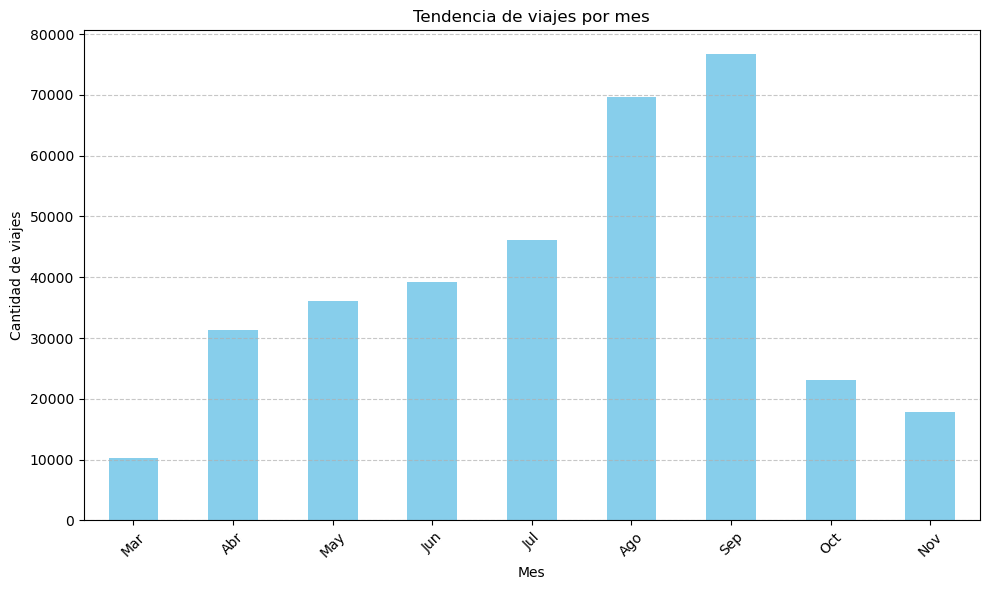

In [37]:

trips['start_date'] = pd.to_datetime(trips['start_date'], format='%m/%d/%Y %H:%M:%S')

# Extraer el mes
trips['month'] = trips['start_date'].dt.month

# Contar los viajes por mes
monthly_counts = trips['month'].value_counts().sort_index()

# Diccionario para nombres de meses
month_names = {
    1: 'Ene', 2: 'Feb', 3: 'Mar', 4: 'Abr',
    5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Ago',
    9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dic'
}

# Reemplazar los números por nombres
monthly_counts.index = monthly_counts.index.map(month_names)

# Graficar
plt.figure(figsize=(10, 6))
monthly_counts.plot(kind='bar', color='skyblue')
plt.title('Tendencia de viajes por mes')
plt.xlabel('Mes')
plt.ylabel('Cantidad de viajes')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
trips.info()

<class 'pandas.core.frame.DataFrame'>
Index: 350398 entries, 0 to 549285
Data columns (total 14 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   seq_id      350398 non-null  int64         
 1   hubway_id   350398 non-null  int64         
 2   status      350398 non-null  object        
 3   duration    350398 non-null  int64         
 4   start_date  350398 non-null  datetime64[ns]
 5   strt_statn  350398 non-null  int64         
 6   end_date    350398 non-null  object        
 7   end_statn   350398 non-null  int64         
 8   bike_nr     350398 non-null  object        
 9   subsc_type  350398 non-null  object        
 10  zip_code    350398 non-null  object        
 11  birth_date  350398 non-null  float64       
 12  gender      350398 non-null  object        
 13  month       350398 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(5), object(6)
memory usage: 38.8+ MB


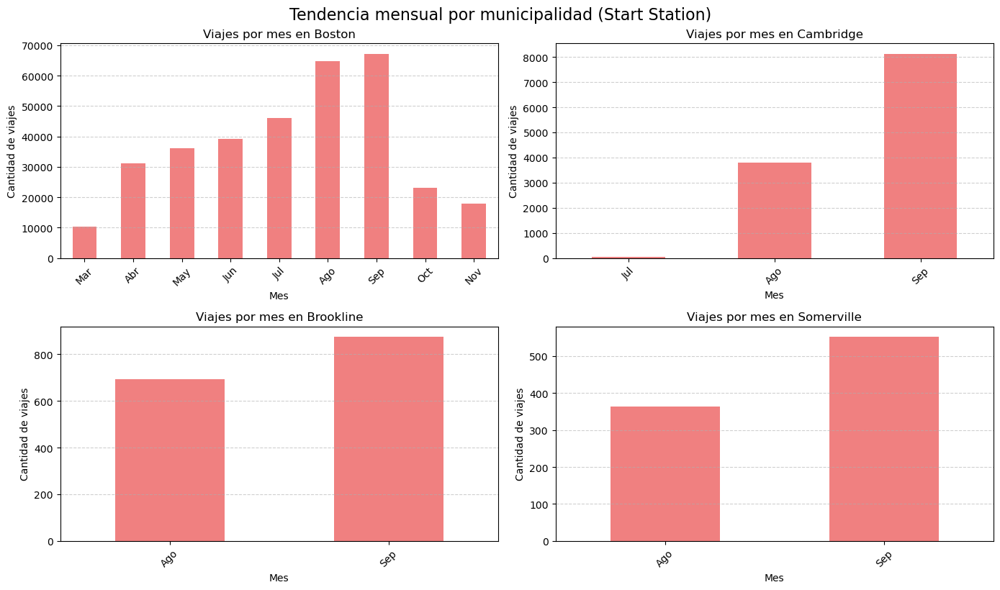

In [51]:

# 2. Asegurar formato datetime en la columna de tiempo
trips['start_time'] = pd.to_datetime(trips['start_date'], format='%m/%d/%Y %H:%M:%S')
trips['month'] = trips['start_time'].dt.month
# 3. Unir el dataset de viajes con el de estaciones para obtener la municipalidad de la estación de inicio
merged = trips.merge(stations[['id', 'municipal']], left_on='strt_statn', right_on='id', how='left')

# 4. Seleccionar las 4 municipalidades que más aparecen
top_munis = merged['municipal'].value_counts().head(4).index.tolist()

# 5. Crear los gráficos
plt.figure(figsize=(14, 8))

for i, muni in enumerate(top_munis, start=1):
    # Filtrar solo por esa municipalidad
    df_muni = merged[merged['municipal'] == muni]
    
    # Agrupar por mes
    counts = df_muni['month'].value_counts().sort_index()
    
    # Traducir mes a nombre
    month_names = {
        1: 'Ene', 2: 'Feb', 3: 'Mar', 4: 'Abr',
        5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Ago',
        9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dic'
    }
    counts.index = counts.index.map(month_names)
    
    # Subplot
    plt.subplot(2, 2, i)
    counts.plot(kind='bar', color='lightcoral')
    plt.title(f'Viajes por mes en {muni}')
    plt.xlabel('Mes')
    plt.ylabel('Cantidad de viajes')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.suptitle('Tendencia mensual por municipalidad (Start Station)', fontsize=16, y=1.02)
plt.show()